In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
sshikamaru_car_object_detection_path = kagglehub.dataset_download('sshikamaru/car-object-detection')

print('Data source import complete.')


In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [ ]:
import os
import sys
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')


In [ ]:
# ==============================================================================
# 2. ANALIZA DATASETU
# ==============================================================================

# Sprawdź czy pliki istnieją
print(f"   Train images: {os.path.exists(TRAIN_IMAGES_DIR)} - {TRAIN_IMAGES_DIR}")
print(f"   Test images: {os.path.exists(TEST_IMAGES_DIR)} - {TEST_IMAGES_DIR}")
print(f"   Train CSV: {os.path.exists(TRAIN_CSV)} - {TRAIN_CSV}")

if os.path.exists(TRAIN_IMAGES_DIR):
    train_images = [f for f in os.listdir(TRAIN_IMAGES_DIR) if f.endswith(('.jpg', '.jpeg', '.png'))]
    print(f"   Znaleziono {len(train_images)} obrazów treningowych")

if os.path.exists(TEST_IMAGES_DIR):
    test_images = [f for f in os.listdir(TEST_IMAGES_DIR) if f.endswith(('.jpg', '.jpeg', '.png'))]
    print(f"   Znaleziono {len(test_images)} obrazów testowych")

# Wczytaj i analizuj CSV
if os.path.exists(TRAIN_CSV):
    print(f"Analiza CSV z adnotacjami")
    df = pd.read_csv(TRAIN_CSV)
    print(f"   Kształt CSV: {df.shape}")
    print(f"\n   Pierwsze wiersze:")
    print(df.head())
    print(f"\n   Kolumny: {list(df.columns)}")
    print(f"\n   Info:")
    print(df.info())
    print(f"\n   Statystyki:")
    print(df.describe())

    # Liczba unikalnych obrazów
    if 'image' in df.columns:
        unique_images = df['image'].nunique()
        print(f"\nUnikalne obrazy: {unique_images}")
        print(f"Średnio boundingboxów na obraz: {len(df)/unique_images:.2f}")
else:
    print(" Plik CSV nie został znaleziony!")

    df = None



   Train images: True - /kaggle/input/car-object-detection/data/training_images
   Test images: True - /kaggle/input/car-object-detection/data/testing_images
   Train CSV: True - /kaggle/input/car-object-detection/data/train_solution_bounding_boxes (1).csv
   ✓ Znaleziono 1001 obrazów treningowych
   ✓ Znaleziono 175 obrazów testowych
Analiza CSV z adnotacjami
   Kształt CSV: (559, 5)

   Pierwsze wiersze:
             image        xmin        ymin        xmax        ymax
0   vid_4_1000.jpg  281.259045  187.035071  327.727931  223.225547
1  vid_4_10000.jpg   15.163531  187.035071  120.329957  236.430180
2  vid_4_10040.jpg  239.192475  176.764801  361.968162  236.430180
3  vid_4_10020.jpg  496.483358  172.363256  630.020260  231.539575
4  vid_4_10060.jpg   16.630970  186.546010  132.558611  238.386422

   Kolumny: ['image', 'xmin', 'ymin', 'xmax', 'ymax']

   Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 559 entries, 0 to 558
Data columns (total 5 columns):
 #   Column  Non-Nu

In [ ]:
# ==============================================================================
# 3. MODEL - MOBILENET V2 SSD
# ==============================================================================


from torchvision.models import mobilenet_v2

class MobileNetV2SSD(nn.Module):
    """SSD with MobileNetV2 backbone for car detection"""

    def __init__(self, num_classes=2):
        super(MobileNetV2SSD, self).__init__()
        self.num_classes = num_classes

        # MobileNetV2 backbone (pretrained on ImageNet)
        print("   📥 Ładowanie pretrenowanego MobileNetV2...")
        backbone = mobilenet_v2(pretrained=True)
        self.features = backbone.features

        # Feature dimension from MobileNetV2
        feature_dim = 1280

        # Classification head
        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d((1, 1)),
            nn.Flatten(),
            nn.Dropout(0.3),
            nn.Linear(feature_dim, 512),
            nn.ReLU(inplace=True),
            nn.Dropout(0.3),
            nn.Linear(512, num_classes)
        )

        # Bounding box regression head (cx, cy, w, h)
        self.box_predictor = nn.Sequential(
            nn.AdaptiveAvgPool2d((1, 1)),
            nn.Flatten(),
            nn.Dropout(0.2),
            nn.Linear(feature_dim, 256),
            nn.ReLU(inplace=True),
            nn.Dropout(0.2),
            nn.Linear(256, 4)
        )

        # Confidence head (objectness score)
        self.confidence = nn.Sequential(
            nn.AdaptiveAvgPool2d((1, 1)),
            nn.Flatten(),
            nn.Linear(feature_dim, 1),
            nn.Sigmoid()
        )

        self._initialize_weights()
        print("   ✓ Model utworzony")

    def forward(self, x):
        if isinstance(x, list):
            x = torch.stack(x)

        # Extract features
        features = self.features(x)

        # Predictions
        class_pred = self.classifier(features)
        box_pred = self.box_predictor(features)
        conf_pred = self.confidence(features)

        return class_pred, box_pred, conf_pred

    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight)
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)

class SSDLoss(nn.Module):
    """Multi-task loss for SSD: classification + localization + confidence"""

    def __init__(self, alpha=1.0, beta=0.5):
        super().__init__()
        self.alpha = alpha  # weight for localization loss
        self.beta = beta    # weight for confidence loss
        self.classification_loss = nn.CrossEntropyLoss()
        self.localization_loss = nn.SmoothL1Loss()
        self.confidence_loss = nn.BCELoss()

    def forward(self, predictions, targets):
        class_pred, box_pred, conf_pred = predictions
        class_targets, box_targets, has_object = targets

        # Classification loss
        cls_loss = self.classification_loss(class_pred, class_targets)

        # Localization loss (only for positive samples)
        positive_mask = class_targets > 0
        if positive_mask.sum() > 0:
            loc_loss = self.localization_loss(
                box_pred[positive_mask],
                box_targets[positive_mask]
            )
        else:
            loc_loss = torch.tensor(0.0, device=box_pred.device)

        # Confidence loss (objectness)
        conf_targets = has_object.float().unsqueeze(1)
        conf_loss = self.confidence_loss(conf_pred, conf_targets)

        # Total loss
        total_loss = cls_loss + self.alpha * loc_loss + self.beta * conf_loss

        return total_loss, cls_loss, loc_loss, conf_loss

In [ ]:
# ==============================================================================
# 4. DATASET CLASS
# ==============================================================================

class CarDetectionDataset(Dataset):
    """Dataset for car detection from CSV annotations"""

    def __init__(self, annotations_df, images_dir, image_size=300, is_train=True):
        """
        Args:
            annotations_df: DataFrame with columns [image, xmin, ymin, xmax, ymax]
            images_dir: Directory with images
            image_size: Size to resize images to
            is_train: Training or validation mode
        """
        self.images_dir = images_dir
        self.image_size = image_size
        self.is_train = is_train

        # Group annotations by image
        if annotations_df is not None and len(annotations_df) > 0:
            # Detect column names (they might vary)
            img_col = 'image' if 'image' in annotations_df.columns else annotations_df.columns[0]

            self.grouped = annotations_df.groupby(img_col).agg(list).reset_index()
            self.img_col = img_col
        else:
            self.grouped = pd.DataFrame()
            self.img_col = None

        print(f"Dataset: {len(self.grouped)} unikalnych obrazów")

    def __len__(self):
        return len(self.grouped)

    def __getitem__(self, idx):
        row = self.grouped.iloc[idx]
        img_name = row[self.img_col]

        # Load image
        img_path = os.path.join(self.images_dir, img_name)

        # Handle different image formats
        if not os.path.exists(img_path):
            # Try with different extensions
            base_name = os.path.splitext(img_name)[0]
            for ext in ['.jpg', '.jpeg', '.png', '.JPG', '.JPEG']:
                alt_path = os.path.join(self.images_dir, base_name + ext)
                if os.path.exists(alt_path):
                    img_path = alt_path
                    break

        image = Image.open(img_path).convert('RGB')
        original_w, original_h = image.size

        # Resize
        image = image.resize((self.image_size, self.image_size))

        # Transform to tensor
        image = transforms.ToTensor()(image)
        image = transforms.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
        )(image)

        # Get bounding boxes
        # Detect column format
        bbox_cols = [col for col in row.index if col not in [self.img_col]]

        if len(bbox_cols) >= 4:
            # Assume format: xmin, ymin, xmax, ymax (or similar)
            xmin_col, ymin_col, xmax_col, ymax_col = bbox_cols[:4]

            xmins = row[xmin_col] if isinstance(row[xmin_col], list) else [row[xmin_col]]
            ymins = row[ymin_col] if isinstance(row[ymin_col], list) else [row[ymin_col]]
            xmaxs = row[xmax_col] if isinstance(row[xmax_col], list) else [row[xmax_col]]
            ymaxs = row[ymax_col] if isinstance(row[ymax_col], list) else [row[ymax_col]]

            # Take first bounding box (simplification for single object per image)
            xmin = float(xmins[0]) / original_w
            ymin = float(ymins[0]) / original_h
            xmax = float(xmaxs[0]) / original_w
            ymax = float(ymaxs[0]) / original_h

            # Convert to center format (cx, cy, w, h)
            cx = (xmin + xmax) / 2
            cy = (ymin + ymax) / 2
            w = xmax - xmin
            h = ymax - ymin

            box = [cx, cy, w, h]
            label = 1  # car class
            has_object = True
        else:
            # No bounding box
            box = [0, 0, 0, 0]
            label = 0  # background
            has_object = False

        return (
            image,
            torch.tensor(label, dtype=torch.long),
            torch.tensor(box, dtype=torch.float32),
            torch.tensor(has_object, dtype=torch.bool)
        )



In [ ]:
# ==============================================================================
# 6. INICJALIZACJA MODELU
# ==============================================================================

if train_loader is not None:

    # Model
    model = MobileNetV2SSD(num_classes=NUM_CLASSES).to(DEVICE)

    # Loss
    criterion = SSDLoss(alpha=1.0, beta=0.5)

    # Optimizer
    optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE, weight_decay=1e-4)

    # Scheduler
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', factor=0.5, patience=5, verbose=True
    )

    print(f"\n Model, loss i optimizer gotowe")

    # Test forward pass
    test_batch = next(iter(train_loader))
    test_images = test_batch[0].to(DEVICE)

    with torch.no_grad():
        test_class, test_box, test_conf = model(test_images)
        print(f"   Class shape: {test_class.shape}")
        print(f"   Box shape: {test_box.shape}")
        print(f"   Confidence shape: {test_conf.shape}")

    print(f"   ✓ Model działa poprawnie!")


   📥 Ładowanie pretrenowanego MobileNetV2...


Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 122MB/s]


   ✓ Model utworzony

 Model, loss i optimizer gotowe
   Class shape: torch.Size([8, 2])
   Box shape: torch.Size([8, 4])
   Confidence shape: torch.Size([8, 1])
   ✓ Model działa poprawnie!


In [ ]:
# ==============================================================================
# 6. INICJALIZACJA MODELU
# ==============================================================================

if train_loader is not None:


    # Model
    model = MobileNetV2SSD(num_classes=NUM_CLASSES).to(DEVICE)

    # Loss
    criterion = SSDLoss(alpha=1.0, beta=0.5)

    # Optimizer
    optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE, weight_decay=1e-4)

    # Scheduler
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', factor=0.5, patience=5, verbose=True
    )

    print(f"\n   Model, loss i optimizer gotowe")

    # Test forward pass

    test_batch = next(iter(train_loader))
    test_images = test_batch[0].to(DEVICE)

    with torch.no_grad():
        test_class, test_box, test_conf = model(test_images)
        print(f"   Class shape: {test_class.shape}")
        print(f"   Box shape: {test_box.shape}")
        print(f"   Confidence shape: {test_conf.shape}")

    print(f"   Model działa poprawnie!")


   📥 Ładowanie pretrenowanego MobileNetV2...
   ✓ Model utworzony

   Model, loss i optimizer gotowe
   Class shape: torch.Size([8, 2])
   Box shape: torch.Size([8, 4])
   Confidence shape: torch.Size([8, 1])
   Model działa poprawnie!


In [ ]:
# ==============================================================================
# 7. FUNKCJE TRENINGOWE
# ==============================================================================

def train_epoch(model, train_loader, criterion, optimizer, device, epoch):
    """Train for one epoch"""
    model.train()
    running_loss = 0.0
    running_cls_loss = 0.0
    running_loc_loss = 0.0
    running_conf_loss = 0.0
    correct = 0
    total = 0

    for batch_idx, (images, labels, boxes, has_obj) in enumerate(train_loader):
        images = images.to(device)
        labels = labels.to(device)
        boxes = boxes.to(device)
        has_obj = has_obj.to(device)

        optimizer.zero_grad()

        # Forward
        class_pred, box_pred, conf_pred = model(images)

        # Loss
        loss, cls_loss, loc_loss, conf_loss = criterion(
            (class_pred, box_pred, conf_pred),
            (labels, boxes, has_obj)
        )

        # Backward
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()

        # Statistics
        running_loss += loss.item()
        running_cls_loss += cls_loss.item()
        running_loc_loss += loc_loss.item()
        running_conf_loss += conf_loss.item()

        _, predicted = torch.max(class_pred.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

        # Progress
        if batch_idx % 20 == 0:
            print(f"   Batch [{batch_idx}/{len(train_loader)}] "
                  f"Loss: {loss.item():.4f} "
                  f"(Cls: {cls_loss.item():.3f}, "
                  f"Loc: {loc_loss.item():.3f}, "
                  f"Conf: {conf_loss.item():.3f})")

    accuracy = 100 * correct / total
    avg_loss = running_loss / len(train_loader)
    avg_cls = running_cls_loss / len(train_loader)
    avg_loc = running_loc_loss / len(train_loader)
    avg_conf = running_conf_loss / len(train_loader)

    return avg_loss, accuracy, avg_cls, avg_loc, avg_conf

def validate_epoch(model, val_loader, criterion, device):
    """Validate for one epoch"""
    model.eval()
    running_loss = 0.0
    running_cls_loss = 0.0
    running_loc_loss = 0.0
    running_conf_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels, boxes, has_obj in val_loader:
            images = images.to(device)
            labels = labels.to(device)
            boxes = boxes.to(device)
            has_obj = has_obj.to(device)

            # Forward
            class_pred, box_pred, conf_pred = model(images)

            # Loss
            loss, cls_loss, loc_loss, conf_loss = criterion(
                (class_pred, box_pred, conf_pred),
                (labels, boxes, has_obj)
            )

            # Statistics
            running_loss += loss.item()
            running_cls_loss += cls_loss.item()
            running_loc_loss += loc_loss.item()
            running_conf_loss += conf_loss.item()

            _, predicted = torch.max(class_pred.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    accuracy = 100 * correct / total
    avg_loss = running_loss / len(val_loader)
    avg_cls = running_cls_loss / len(val_loader)
    avg_loc = running_loc_loss / len(val_loader)
    avg_conf = running_conf_loss / len(val_loader)

    return avg_loss, accuracy, avg_cls, avg_loc, avg_conf


In [ ]:
# ==============================================================================
# 8. TRENING
# ==============================================================================

if train_loader is not None:

    # History
    history = {
        'train_loss': [], 'train_acc': [],
        'val_loss': [], 'val_acc': [],
        'train_cls': [], 'train_loc': [], 'train_conf': [],
        'val_cls': [], 'val_loc': [], 'val_conf': []
    }

    best_val_loss = float('inf')
    patience_counter = 0
    early_stop_patience = 15

    for epoch in range(NUM_EPOCHS):

        print(f"Epoch {epoch+1}/{NUM_EPOCHS}")


        # Train
        train_loss, train_acc, train_cls, train_loc, train_conf = train_epoch(
            model, train_loader, criterion, optimizer, DEVICE, epoch
        )

        # Validate
        val_loss, val_acc, val_cls, val_loc, val_conf = validate_epoch(
            model, val_loader, criterion, DEVICE
        )

        # Scheduler
        scheduler.step(val_loss)

        # Save history
        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)
        history['train_cls'].append(train_cls)
        history['train_loc'].append(train_loc)
        history['train_conf'].append(train_conf)
        history['val_cls'].append(val_cls)
        history['val_loc'].append(val_loc)
        history['val_conf'].append(val_conf)

        # Print summary
        print(f"\nEpoch {epoch+1} Summary:")
        print(f"   Train - Loss: {train_loss:.4f}, Acc: {train_acc:.2f}%")
        print(f"   Val   - Loss: {val_loss:.4f}, Acc: {val_acc:.2f}%")
        print(f"   Components - Cls: {val_cls:.3f}, Loc: {val_loc:.3f}, Conf: {val_conf:.3f}")

        # Save best model
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'val_loss': val_loss,
                'val_acc': val_acc
            }, os.path.join(MODEL_SAVE_PATH, 'best_model.pth'))
            print(f"Zapisano najlepszy model (Val Loss: {val_loss:.4f})")
            patience_counter = 0
        else:
            patience_counter += 1

        # Early stopping
        if patience_counter >= early_stop_patience:
            print(f"\n Early stopping po {epoch+1} epokach")
            break

    # Save final model
    torch.save(model.state_dict(), os.path.join(MODEL_SAVE_PATH, 'final_model.pth'))

    print("\n" + "=" * 80)
    print("TRENING ZAKOŃCZONY!")
    print("=" * 80)
    print(f"Najlepsza Val Loss: {best_val_loss:.4f}")
    print(f"Modele zapisane w: {MODEL_SAVE_PATH}")


Epoch 1/250
   Batch [0/36] Loss: 1.6701 (Cls: 1.033, Loc: 0.220, Conf: 0.835)
   Batch [20/36] Loss: 0.0263 (Cls: 0.000, Loc: 0.026, Conf: 0.001)

Epoch 1 Summary:
   Train - Loss: 0.1801, Acc: 97.89%
   Val   - Loss: 0.0190, Acc: 100.00%
   Components - Cls: 0.000, Loc: 0.019, Conf: 0.000
Zapisano najlepszy model (Val Loss: 0.0190)
Epoch 2/250
   Batch [0/36] Loss: 0.0064 (Cls: 0.000, Loc: 0.006, Conf: 0.000)
   Batch [20/36] Loss: 0.0234 (Cls: 0.000, Loc: 0.023, Conf: 0.000)

Epoch 2 Summary:
   Train - Loss: 0.0130, Acc: 100.00%
   Val   - Loss: 0.0092, Acc: 100.00%
   Components - Cls: 0.000, Loc: 0.009, Conf: 0.000
Zapisano najlepszy model (Val Loss: 0.0092)
Epoch 3/250
   Batch [0/36] Loss: 0.0084 (Cls: 0.000, Loc: 0.008, Conf: 0.000)
   Batch [20/36] Loss: 0.0100 (Cls: 0.000, Loc: 0.010, Conf: 0.000)

Epoch 3 Summary:
   Train - Loss: 0.0110, Acc: 100.00%
   Val   - Loss: 0.0044, Acc: 100.00%
   Components - Cls: 0.000, Loc: 0.004, Conf: 0.000
Zapisano najlepszy model (Val Loss

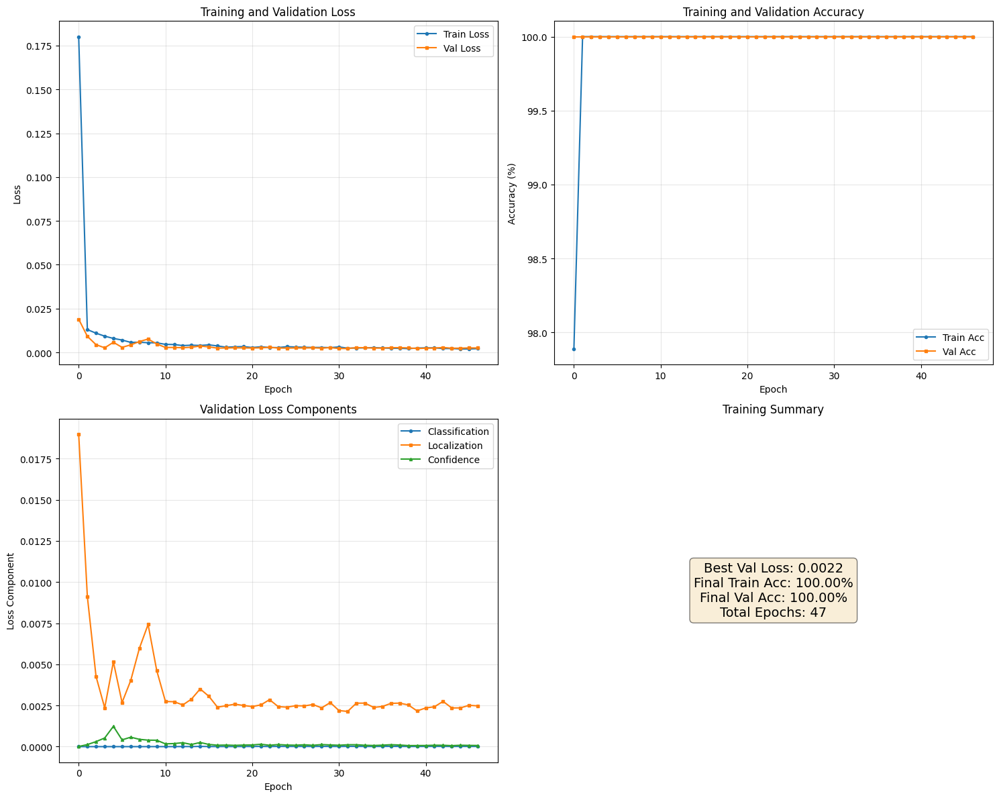

Wykresy zapisane


In [ ]:
# ==============================================================================
# 9. WYKRESY
# ==============================================================================

if train_loader is not None:

    fig, axes = plt.subplots(2, 2, figsize=(15, 12))

    # Loss
    axes[0, 0].plot(history['train_loss'], label='Train Loss', marker='o', markersize=3)
    axes[0, 0].plot(history['val_loss'], label='Val Loss', marker='s', markersize=3)
    axes[0, 0].set_xlabel('Epoch')
    axes[0, 0].set_ylabel('Loss')
    axes[0, 0].set_title('Training and Validation Loss')
    axes[0, 0].legend()
    axes[0, 0].grid(True, alpha=0.3)

    # Accuracy
    axes[0, 1].plot(history['train_acc'], label='Train Acc', marker='o', markersize=3)
    axes[0, 1].plot(history['val_acc'], label='Val Acc', marker='s', markersize=3)
    axes[0, 1].set_xlabel('Epoch')
    axes[0, 1].set_ylabel('Accuracy (%)')
    axes[0, 1].set_title('Training and Validation Accuracy')
    axes[0, 1].legend()
    axes[0, 1].grid(True, alpha=0.3)

    # Loss components (validation)
    axes[1, 0].plot(history['val_cls'], label='Classification', marker='o', markersize=3)
    axes[1, 0].plot(history['val_loc'], label='Localization', marker='s', markersize=3)
    axes[1, 0].plot(history['val_conf'], label='Confidence', marker='^', markersize=3)
    axes[1, 0].set_xlabel('Epoch')
    axes[1, 0].set_ylabel('Loss Component')
    axes[1, 0].set_title('Validation Loss Components')
    axes[1, 0].legend()
    axes[1, 0].grid(True, alpha=0.3)

    # Learning rate (if available)
    axes[1, 1].text(0.5, 0.5, f'Best Val Loss: {best_val_loss:.4f}\n'
                               f'Final Train Acc: {history["train_acc"][-1]:.2f}%\n'
                               f'Final Val Acc: {history["val_acc"][-1]:.2f}%\n'
                               f'Total Epochs: {len(history["train_loss"])}',
                    ha='center', va='center', fontsize=14,
                    transform=axes[1, 1].transAxes,
                    bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    axes[1, 1].axis('off')
    axes[1, 1].set_title('Training Summary')

    plt.tight_layout()
    plt.savefig(os.path.join(MODEL_SAVE_PATH, 'training_history.png'), dpi=150)
    plt.show()
    print("Wykresy zapisane")


In [ ]:
# ==============================================================================
# 10. FUNKCJE PREDYKCJI I WIZUALIZACJI
# ==============================================================================

def load_trained_model(model_path, device=DEVICE):
    """Load trained model"""
    model = MobileNetV2SSD(num_classes=NUM_CLASSES).to(device)
    checkpoint = torch.load(model_path, map_location=device)

    if 'model_state_dict' in checkpoint:
        model.load_state_dict(checkpoint['model_state_dict'])
    else:
        model.load_state_dict(checkpoint)

    model.eval()
    return model

def predict_image(model, image_path, threshold=0.5, device=DEVICE):
    """Predict on single image"""
    # Load image
    image = Image.open(image_path).convert('RGB')
    original_size = image.size

    # Preprocessing
    transform = transforms.Compose([
        transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    image_tensor = transform(image).unsqueeze(0).to(device)

    # Predict
    with torch.no_grad():
        class_pred, box_pred, conf_pred = model(image_tensor)

        # Get probabilities
        probs = torch.softmax(class_pred, dim=1)
        predicted_class = torch.argmax(probs, dim=1).item()
        class_confidence = probs[0][predicted_class].item()
        obj_confidence = conf_pred[0].item()

        # Combined confidence
        confidence = class_confidence * obj_confidence

        if confidence > threshold and predicted_class > 0:
            # Convert box from center format to corners
            box = box_pred[0].cpu().numpy()
            cx, cy, w, h = box

            # Convert to pixel coordinates
            xmin = (cx - w/2) * original_size[0]
            ymin = (cy - h/2) * original_size[1]
            xmax = (cx + w/2) * original_size[0]
            ymax = (cy + h/2) * original_size[1]

            return {
                'class': CLASS_NAMES[predicted_class],
                'confidence': confidence,
                'box': [xmin, ymin, xmax, ymax],
                'class_conf': class_confidence,
                'obj_conf': obj_confidence
            }

    return None

def visualize_prediction(image_path, model, ground_truth_df=None, threshold=0.5):
    """Visualize prediction with ground truth"""
    # Load image
    image = Image.open(image_path).convert('RGB')
    w, h = image.size

    # Get prediction
    result = predict_image(model, image_path, threshold=threshold)

    # Get ground truth if available
    gt_boxes = []
    if ground_truth_df is not None:
        img_name = os.path.basename(image_path)
        img_col = 'image' if 'image' in ground_truth_df.columns else ground_truth_df.columns[0]
        img_data = ground_truth_df[ground_truth_df[img_col] == img_name]

        if len(img_data) > 0:
            # Get bounding box columns
            bbox_cols = [col for col in img_data.columns if col != img_col]
            if len(bbox_cols) >= 4:
                for _, row in img_data.iterrows():
                    xmin = float(row[bbox_cols[0]])
                    ymin = float(row[bbox_cols[1]])
                    xmax = float(row[bbox_cols[2]])
                    ymax = float(row[bbox_cols[3]])
                    gt_boxes.append([xmin, ymin, xmax, ymax])

    # Visualize
    fig, ax = plt.subplots(1, figsize=(12, 8))
    ax.imshow(image)

    # Draw ground truth (green)
    for box in gt_boxes:
        xmin, ymin, xmax, ymax = box
        rect = patches.Rectangle(
            (xmin, ymin), xmax-xmin, ymax-ymin,
            linewidth=3, edgecolor='green', facecolor='none',
            linestyle='--', label='Ground Truth'
        )
        ax.add_patch(rect)
        ax.text(xmin, ymin-10, 'GT: car',
                color='green', fontsize=12, weight='bold',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))

    # Draw prediction (red)
    if result is not None:
        xmin, ymin, xmax, ymax = result['box']
        rect = patches.Rectangle(
            (xmin, ymin), xmax-xmin, ymax-ymin,
            linewidth=3, edgecolor='red', facecolor='none',
            label='Prediction'
        )
        ax.add_patch(rect)

        label_text = f"{result['class']}: {result['confidence']:.2f}\n"
        label_text += f"(cls:{result['class_conf']:.2f}, obj:{result['obj_conf']:.2f})"

        ax.text(xmin, ymax+20, label_text,
                color='red', fontsize=12, weight='bold',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))
    else:
        ax.text(w/2, 30, 'No detection',
                color='red', fontsize=14, weight='bold',
                ha='center',
                bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.7))

    plt.axis('off')
    plt.title(os.path.basename(image_path), fontsize=14, weight='bold')
    plt.tight_layout()
    plt.show()

def evaluate_on_test_set(model, test_images_dir, ground_truth_df=None,
                         threshold=0.5, max_images=10):
    """Evaluate model on test images"""


    # Get test images
    test_images = [f for f in os.listdir(test_images_dir)
                   if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

    print(f"\nZnaleziono {len(test_images)} obrazów testowych")
    print(f"Wizualizacja {min(max_images, len(test_images))} przykładów...\n")

    # Statistics
    detections = 0

    for i, img_file in enumerate(test_images[:max_images]):
        img_path = os.path.join(test_images_dir, img_file)
        print(f"[{i+1}/{max_images}] {img_file}")

        result = predict_image(model, img_path, threshold=threshold)
        if result:
            detections += 1
            print(f"   Wykryto: {result['class']} (conf: {result['confidence']:.3f})")
        else:
            print(f"   Brak detekcji")

        visualize_prediction(img_path, model, ground_truth_df, threshold=threshold)


    print(f"   Detekcje: {detections}/{max_images} ({100*detections/max_images:.1f}%)")

def create_submission(model, test_images_dir, output_path, threshold=0.5):
    """Create submission file for Kaggle"""


    test_images = [f for f in os.listdir(test_images_dir)
                   if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

    results = []

    for img_file in test_images:
        img_path = os.path.join(test_images_dir, img_file)
        result = predict_image(model, img_path, threshold=threshold)

        if result:
            xmin, ymin, xmax, ymax = result['box']
            results.append({
                'image': img_file,
                'xmin': int(xmin),
                'ymin': int(ymin),
                'xmax': int(xmax),
                'ymax': int(ymax),
                'confidence': result['confidence']
            })
        else:
            # No detection - add dummy box
            results.append({
                'image': img_file,
                'xmin': 0,
                'ymin': 0,
                'xmax': 1,
                'ymax': 1,
                'confidence': 0.0
            })

    # Create DataFrame
    submission_df = pd.DataFrame(results)
    submission_df.to_csv(output_path, index=False)

    print(f"\nSubmission zapisany: {output_path}")
    print(f"   Liczba predykcji: {len(results)}")
    print(f"   Detekcje z conf > {threshold}: {(submission_df['confidence'] > threshold).sum()}")

    return submission_df


   📥 Ładowanie pretrenowanego MobileNetV2...
   ✓ Model utworzony
Model załadowany z: /kaggle/working/models/best_model.pth
Val test


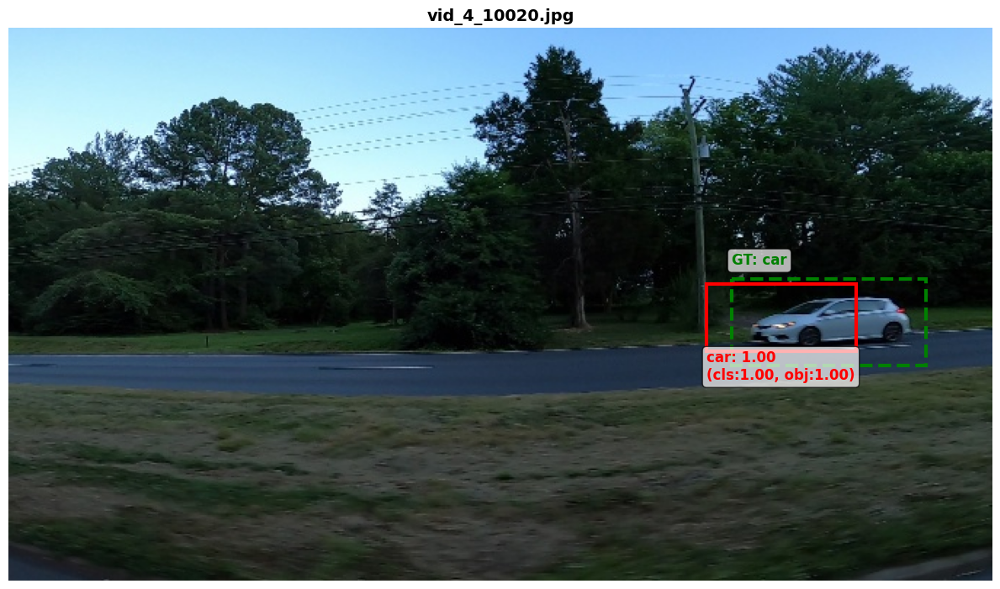

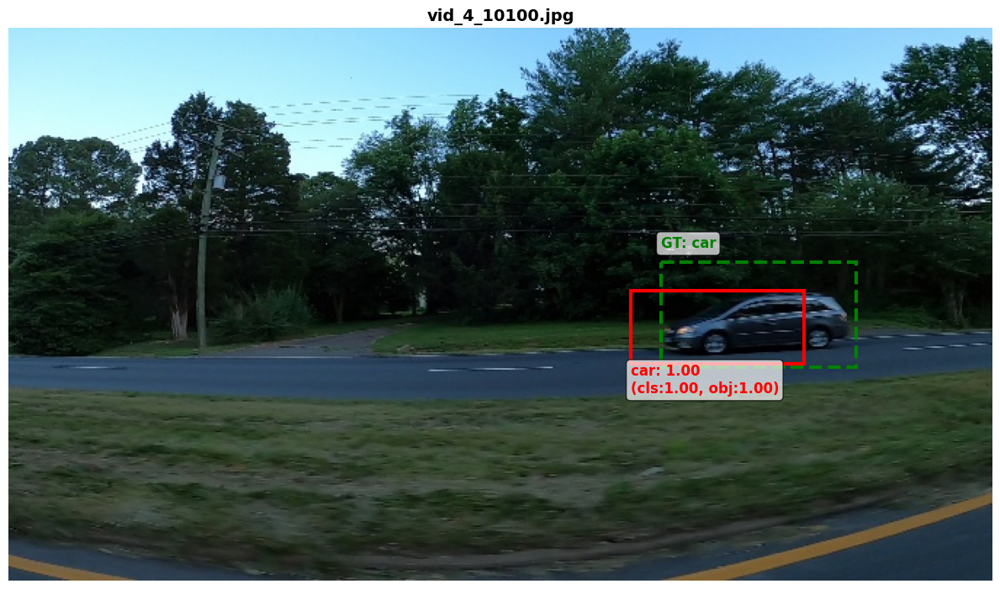

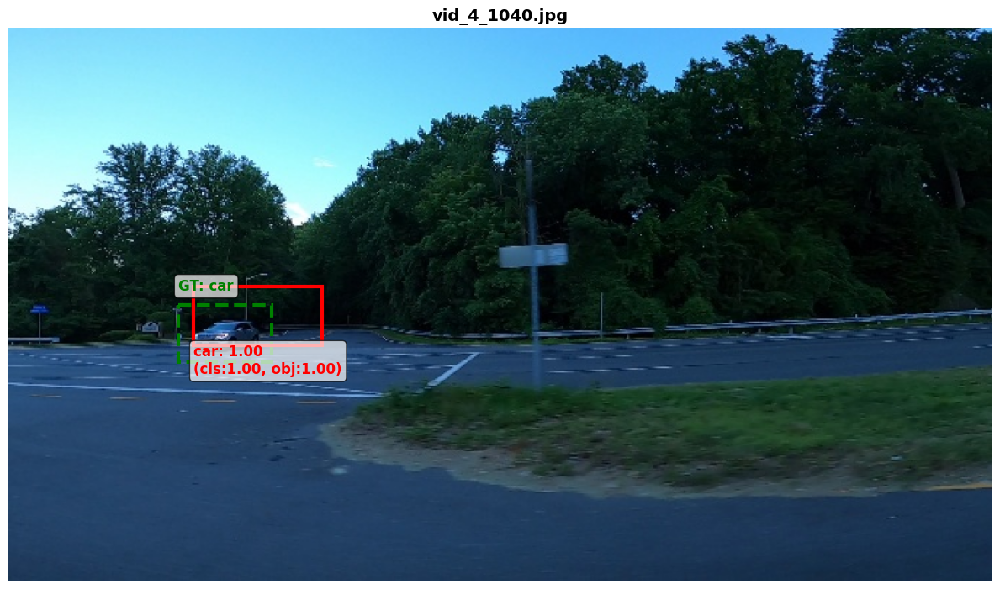

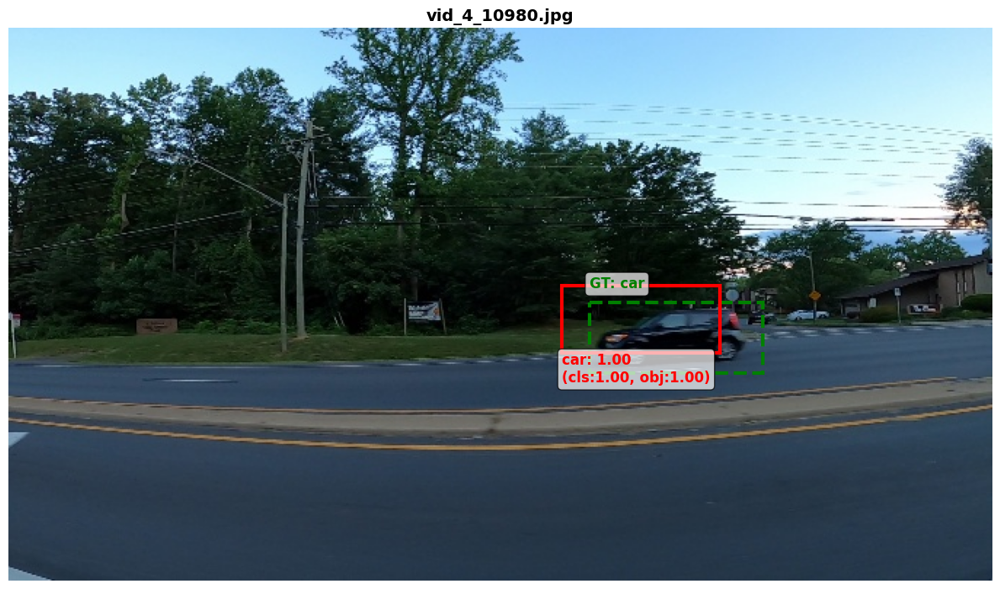

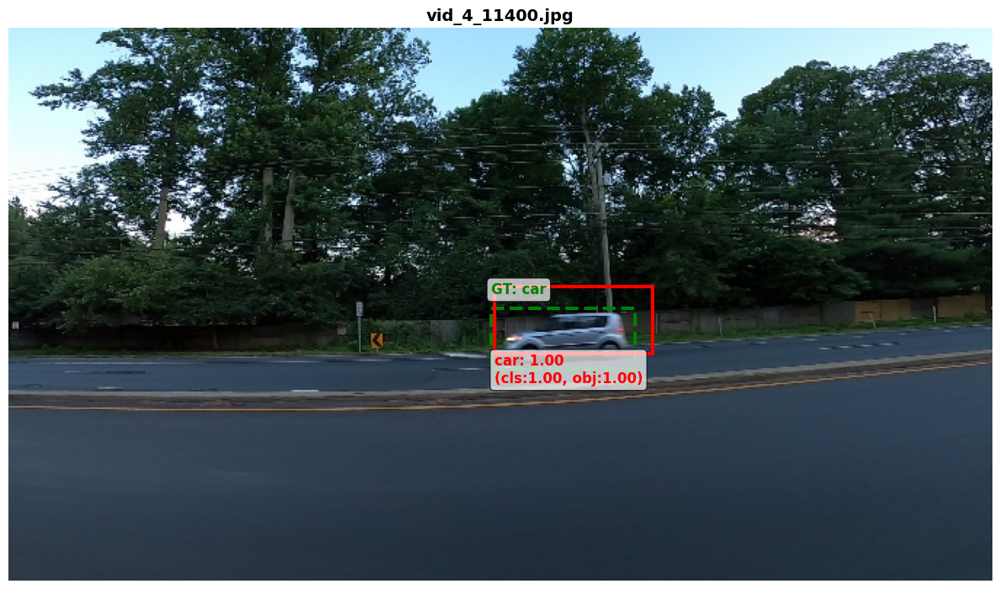


Znaleziono 175 obrazów testowych
Wizualizacja 10 przykładów...

[1/10] vid_5_26420.jpg
   Wykryto: car (conf: 1.000)


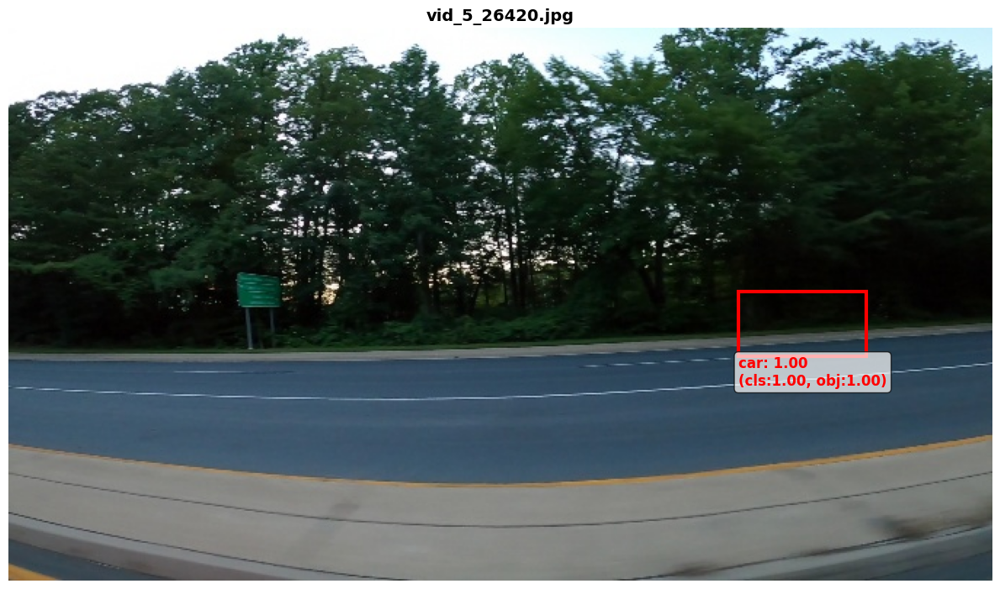

[2/10] vid_5_31520.jpg
   Wykryto: car (conf: 1.000)


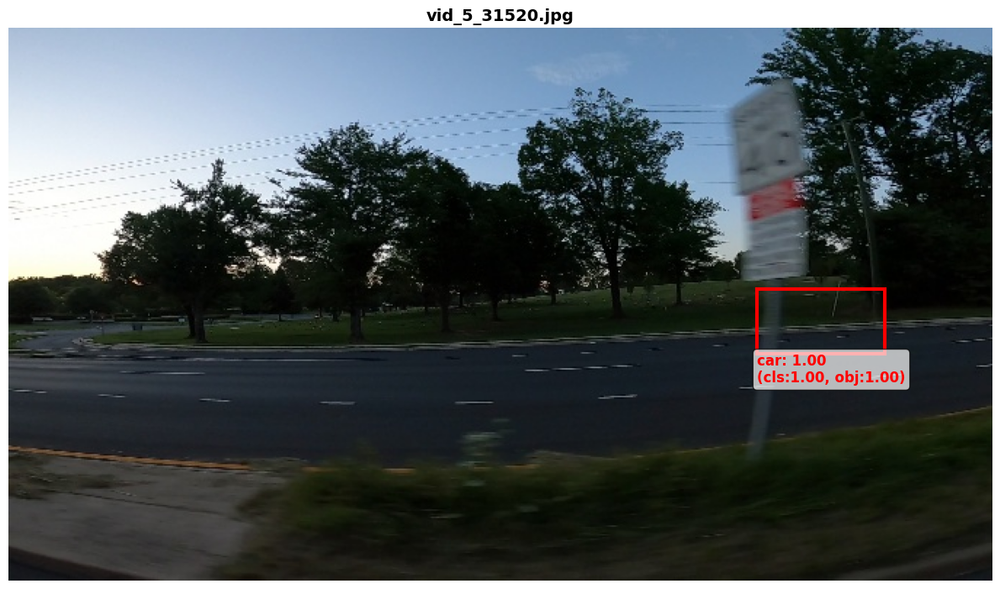

[3/10] vid_5_29420.jpg
   Wykryto: car (conf: 1.000)


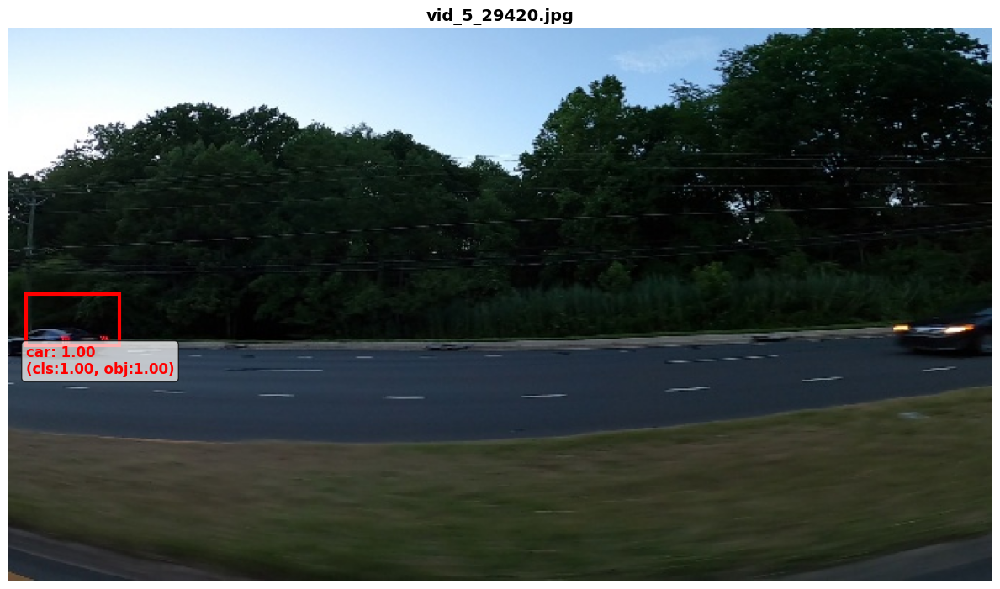

[4/10] vid_5_31720.jpg
   Wykryto: car (conf: 1.000)


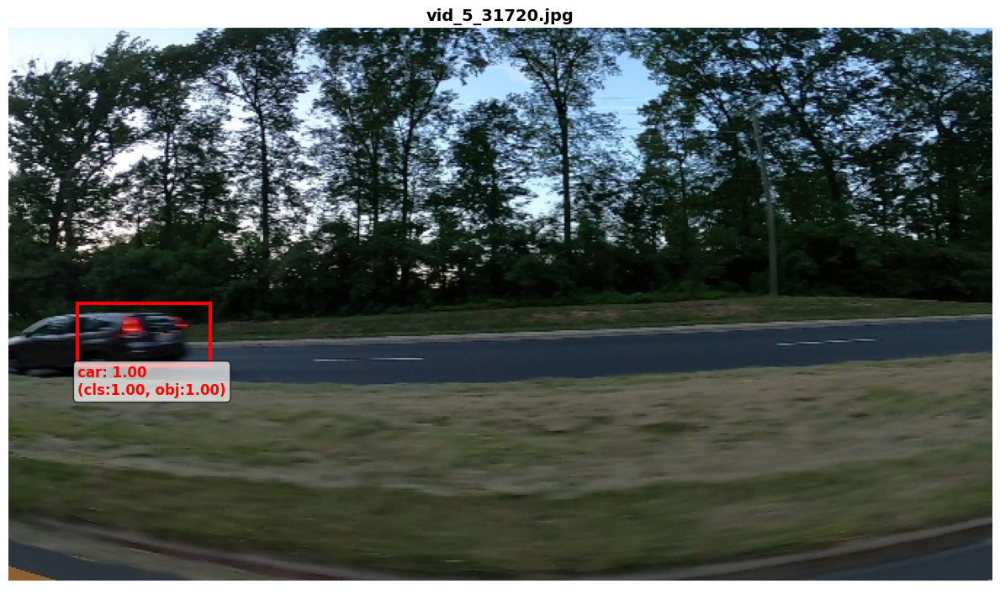

[5/10] vid_5_26560.jpg
   Wykryto: car (conf: 1.000)


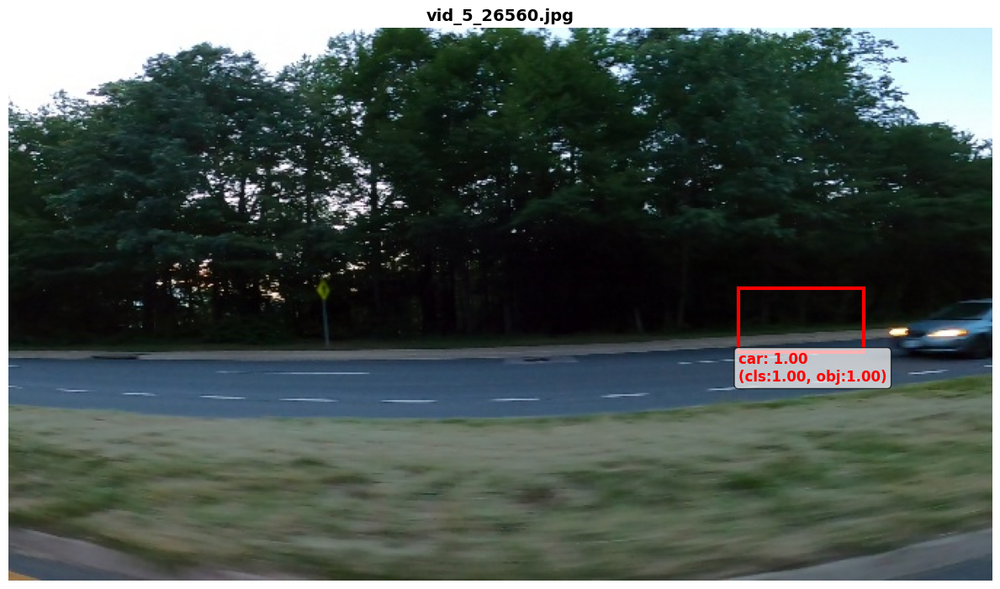

[6/10] vid_5_27840.jpg
   Wykryto: car (conf: 1.000)


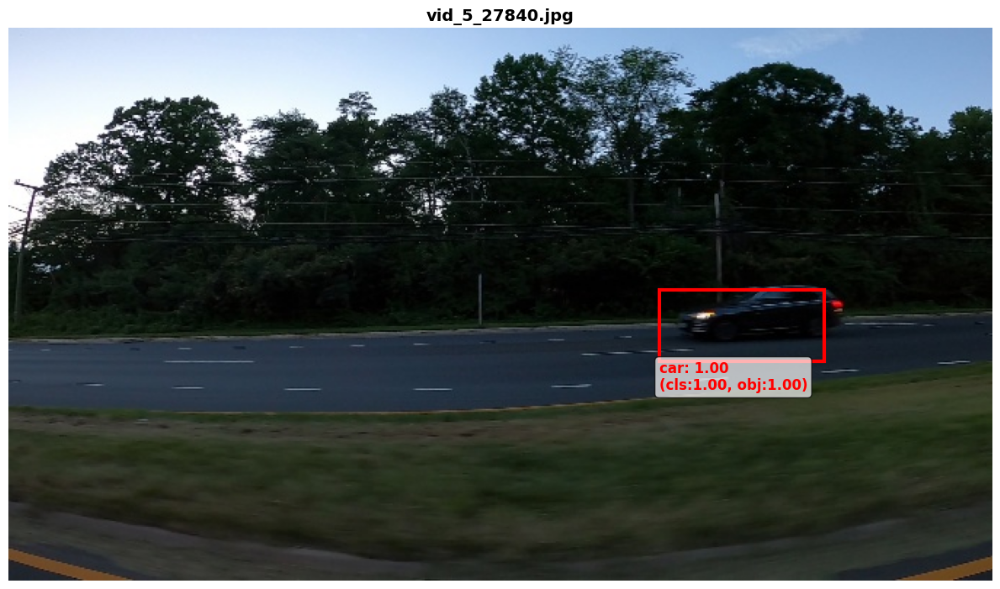

[7/10] vid_5_28560.jpg
   Wykryto: car (conf: 1.000)


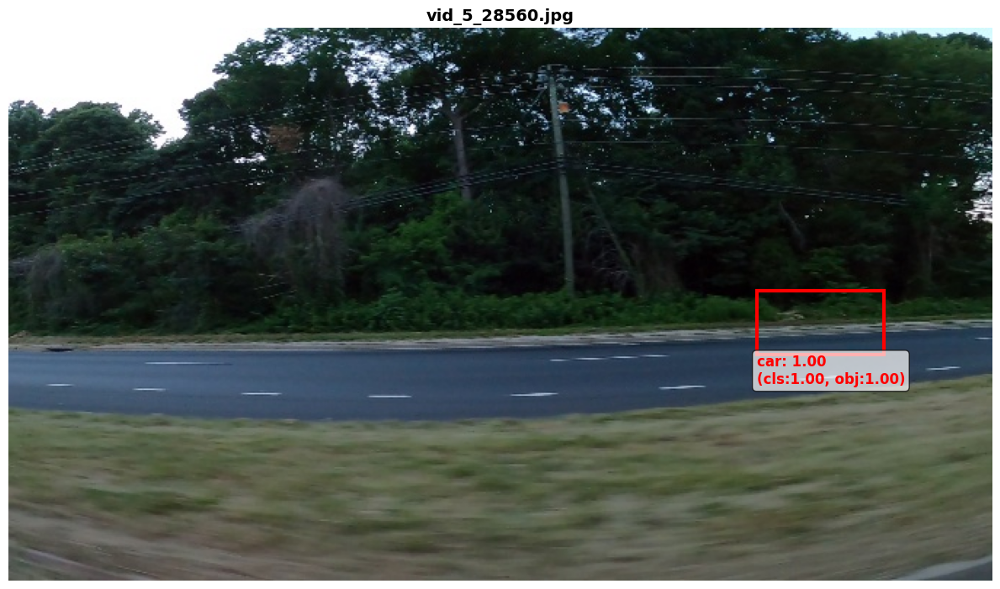

[8/10] vid_5_28360.jpg
   Wykryto: car (conf: 1.000)


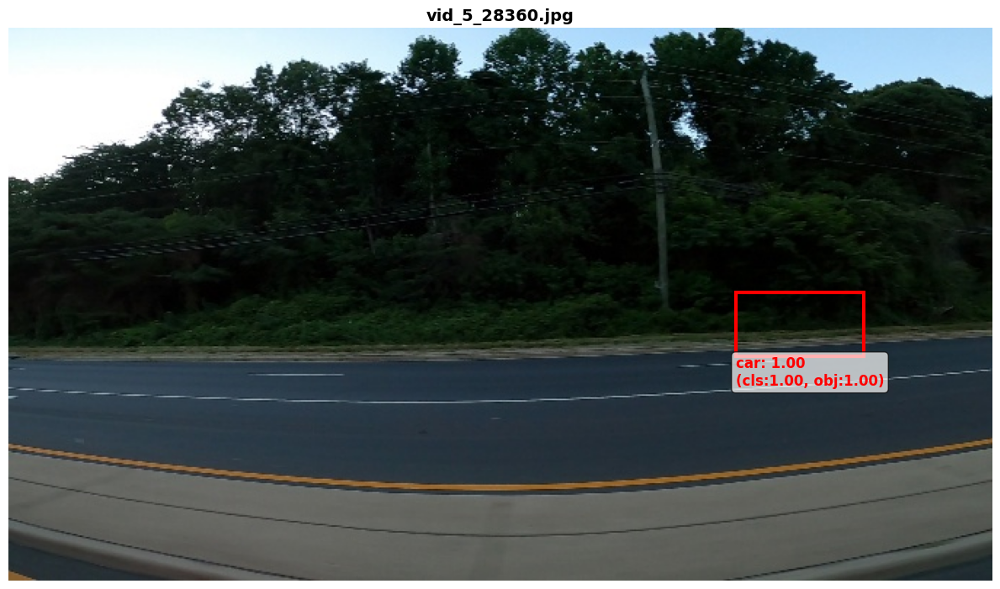

[9/10] vid_5_25240.jpg
   Wykryto: car (conf: 1.000)


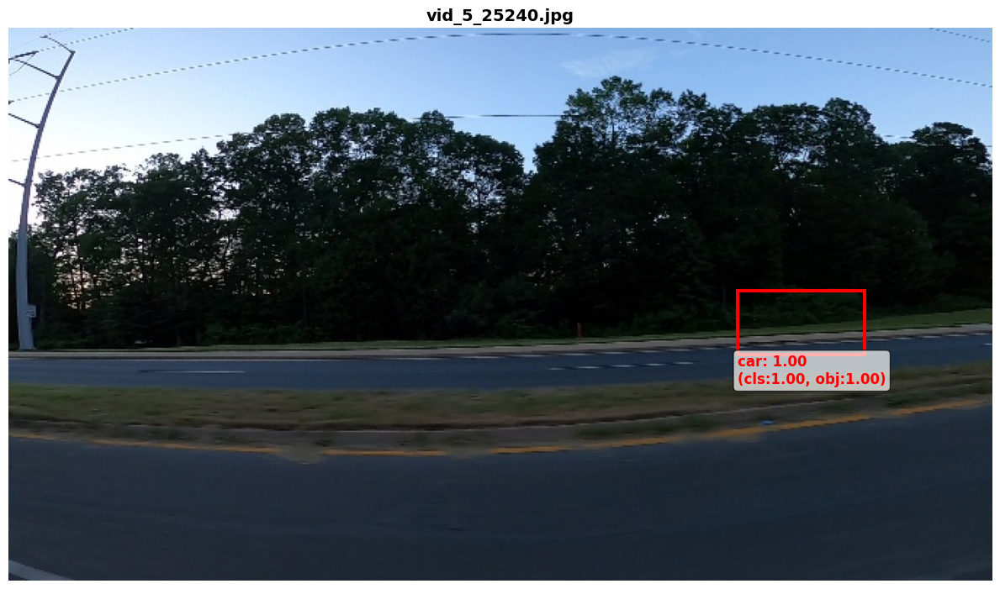

[10/10] vid_5_29560.jpg
   Wykryto: car (conf: 1.000)


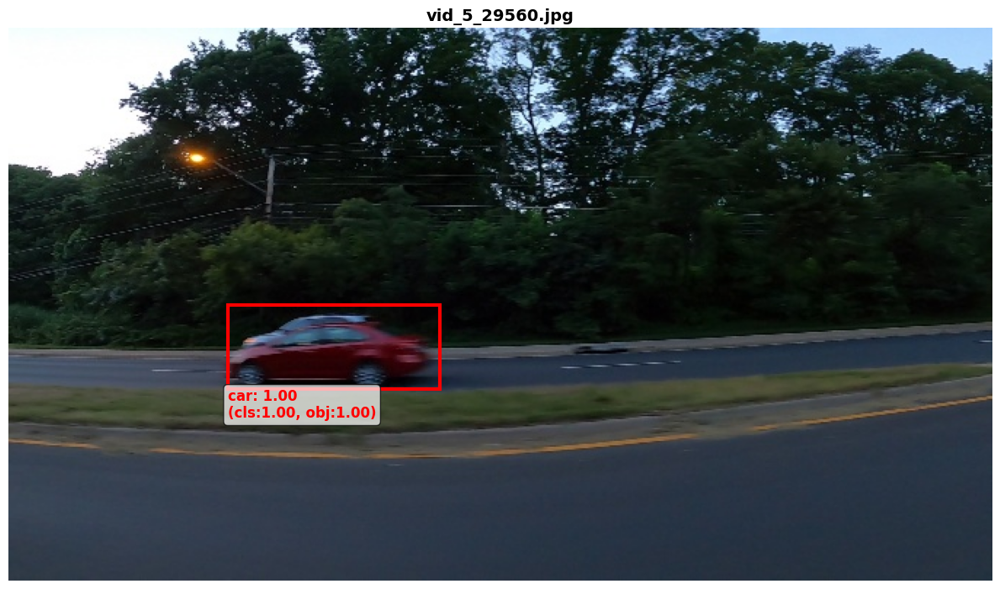

   Detekcje: 10/10 (100.0%)

Submission zapisany: /kaggle/working/models/submission.csv
   Liczba predykcji: 175
   Detekcje z conf > 0.3: 175
Predykcje:
             image  xmin  ymin  xmax  ymax  confidence
0  vid_5_26420.jpg   501   180   588   225    0.999729
1  vid_5_31520.jpg   513   179   601   223    0.999730
2  vid_5_29420.jpg    11   182    75   217    0.999925
3  vid_5_31720.jpg    47   188   137   231    0.999973
4  vid_5_26560.jpg   501   178   587   222    0.999759
5  vid_5_27840.jpg   446   179   559   228    0.999919
6  vid_5_28560.jpg   513   179   601   224    0.999738
7  vid_5_28360.jpg   499   181   586   225    0.999726
8  vid_5_25240.jpg   500   180   587   224    0.999705
9  vid_5_29560.jpg   150   190   295   247    0.999977


In [ ]:
# ==============================================================================
# 11. TESTY I EWALUACJA
# ==============================================================================

if train_loader is not None:

    # Load best model
    best_model_path = os.path.join(MODEL_SAVE_PATH, 'best_model.pth')

    if os.path.exists(best_model_path):

        best_model = load_trained_model(best_model_path)
        print(f"Model załadowany z: {best_model_path}")

        # Test on validation set
        if os.path.exists(TRAIN_IMAGES_DIR) and val_df is not None:
            print("Val test")

            # Get random validation images
            val_images = val_df[val_df.columns[0]].unique()[:5]

            for img_name in val_images:
                img_path = os.path.join(TRAIN_IMAGES_DIR, img_name)
                if os.path.exists(img_path):
                    visualize_prediction(img_path, best_model, df, threshold=0.5)

        # Test on test set (if available)
        if os.path.exists(TEST_IMAGES_DIR):
            evaluate_on_test_set(
                best_model,
                TEST_IMAGES_DIR,
                ground_truth_df=None,  # Test set usually doesn't have GT
                threshold=0.5,
                max_images=10
            )

            # Create submission
            submission_path = os.path.join(MODEL_SAVE_PATH, 'submission.csv')
            submission_df = create_submission(
                best_model,
                TEST_IMAGES_DIR,
                submission_path,
                threshold=0.3  # Lower threshold for submission
            )

            print("Predykcje:")
            print(submission_df.head(10))
    else:
        print(f"\n Nie znaleziono modelu: {best_model_path}")


In [ ]:
# ==============================================================================
# 12. PODSUMOWANIE
# ==============================================================================


if train_loader is not None:
    print(f"\ Pliki wyjściowe:")
    print(f"   • {MODEL_SAVE_PATH}/best_model.pth - najlepszy model")
    print(f"   • {MODEL_SAVE_PATH}/final_model.pth - ostatni model")
    print(f"   • {MODEL_SAVE_PATH}/training_history.png - wykresy treningu")
    print(f"   • {MODEL_SAVE_PATH}/submission.csv - plik submisji Kaggle")

    print(f"\Jak używać:")
    print(f"   # Załaduj model")
    print(f"   model = load_trained_model('{MODEL_SAVE_PATH}/best_model.pth')")
    print(f"   ")
    print(f"   # Predykcja na obrazie")
    print(f"   result = predict_image(model, 'path/to/image.jpg', threshold=0.5)")
    print(f"   ")
    print(f"   # Wizualizacja")
    print(f"   visualize_prediction('path/to/image.jpg', model)")
    print(f"   ")
    print(f"   # Submisja Kaggle")
    print(f"   create_submission(model, test_dir, 'submission.csv')")



In [ ]:
!pip install onnx

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 322.0/322.0 kB 5.8 MB/s eta 0:00:00:00:01
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.20.3
    Uninstalling protobuf-3.20.3:
      Successfully uninstalled protobuf-3.20.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 2.8.0 requires google-cloud-bigquery-storage<3.0.0,>=2.30.0, which is not installed.
google-api-core 1.34.1 requires protobuf!=3.20.0,!=3.20.1,!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<4.0.0dev,>=3.19.5, but you have protobuf 6.32.1 which is incompatible.
google-cloud-translate 3.12.1 requires protobuf!=3.20.0,!=3.20.1,!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<5.0.0dev,>=3.19.5, but you have protobuf 6.32.1 which is incompatible.
pandas-gbq 0.29.1 requires google-api-core<3.0.0,>=2.10.2, but you have google-api-core 1.34.1 which is in

In [ ]:
# ==============================================================================
# DIAGNOSTYKA MODELU PRZED EKSPORTEM ONNX
# ==============================================================================
print("DIAGNOSTYKA MODELU")
print("\n1PODSTAWOWE INFORMACJE O MODELU")


# Sprawdź typ modelu
print(f"Typ modelu: {type(model)}")
print(f"Nazwa klasy: {model.__class__.__name__}")

# Sprawdź czy model jest w trybie eval
print(f"Training mode: {model.training}")

# Sprawdź device
print(f"Device: {next(model.parameters()).device}")

print("\n 2. STRUKTURA MODELU")
print(model)

print("\n3. LICZBA PARAMETRÓW")
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Wszystkie parametry: {total_params:,}")
print(f"Trenowalne parametry: {trainable_params:,}")
print(f"Rozmiar w pamięci: ~{total_params * 4 / (1024**2):.2f} MB (float32)")

print("\n 4. TEST FORWARD PASS")
print("-" * 80)

# Utwórz przykładowy input
test_input = torch.randn(1, 3, IMAGE_SIZE, IMAGE_SIZE).to(DEVICE)
print(f"Input shape: {test_input.shape}")
print(f"Input dtype: {test_input.dtype}")
print(f"Input device: {test_input.device}")

# Forward pass
model.eval()
with torch.no_grad():
    try:
        outputs = model(test_input)
        print(f"\n Forward pass zakończony pomyślnie!")

        # Sprawdź typ outputu
        if isinstance(outputs, tuple):
            print(f"\nOutput jest tuple z {len(outputs)} elementami:")
            for i, out in enumerate(outputs):
                print(f"  Output {i}: shape={out.shape}, dtype={out.dtype}, device={out.device}")
        elif isinstance(outputs, torch.Tensor):
            print(f"\nOutput jest pojedynczym tensorem:")
            print(f"  shape={outputs.shape}, dtype={outputs.dtype}, device={outputs.device}")
        elif isinstance(outputs, dict):
            print(f"\nOutput jest słownikiem z kluczami: {list(outputs.keys())}")
            for key, val in outputs.items():
                print(f"  {key}: shape={val.shape}, dtype={val.dtype}, device={val.device}")
        else:
            print(f"\nOutput jest typu: {type(outputs)}")

    except Exception as e:
        print(f" Błąd podczas forward pass: {str(e)}")
        import traceback
        traceback.print_exc()

print("\n 5. MODUŁY MODELU")
print("Główne moduły:")
for name, module in model.named_children():
    print(f"  - {name}: {type(module).__name__}")

print("\n6. ZALEŻNOŚCI I OPERACJE")
print("-" * 80)

# Sprawdź czy są nietypowe operacje
has_custom_ops = False
for name, module in model.named_modules():
    module_type = type(module).__name__
    if module_type not in ['Sequential', 'Linear', 'Conv2d', 'BatchNorm2d',
                           'ReLU', 'MaxPool2d', 'AvgPool2d', 'Dropout',
                           'AdaptiveAvgPool2d', 'Flatten', 'Sigmoid',
                           'MobileNetV2SSD', 'SSDLoss']:
        if not has_custom_ops:
            print(" Znaleziono niestandardowe operacje:")
            has_custom_ops = True
        print(f"  - {name}: {module_type}")

if not has_custom_ops:
    print("Wszystkie operacje są standardowe")

print("\n7. TRACE TEST")


# Spróbuj zrobić torch.jit.trace
try:
    print("Próba torch.jit.trace...")
    traced_model = torch.jit.trace(model, test_input)
    print(" Trace zakończony pomyślnie!")
    print(f"Traced model type: {type(traced_model)}")
except Exception as e:
    print(f"  Trace nie powiódł się: {str(e)}")
    print("   To może wskazywać na problemy z eksportem ONNX")

print("\n 8. CHECKPOINT INFO")

checkpoint_path = os.path.join(MODEL_SAVE_PATH, "best_model.pth")
if os.path.exists(checkpoint_path):
    checkpoint = torch.load(checkpoint_path, map_location='cpu')
    print(f"Checkpoint keys: {list(checkpoint.keys())}")

    if 'model_state_dict' in checkpoint:
        state_dict = checkpoint['model_state_dict']
    elif 'state_dict' in checkpoint:
        state_dict = checkpoint['state_dict']
    else:
        state_dict = checkpoint

    print(f"Stan dict ma {len(state_dict)} kluczy")
    print(f"Pierwsze 5 kluczy:")
    for i, key in enumerate(list(state_dict.keys())[:5]):
        print(f"  {i+1}. {key}: {state_dict[key].shape}")
else:
    print(f"  Checkpoint nie znaleziony: {checkpoint_path}")

print("\n🔧 9. EKSPORT - REKOMENDOWANE USTAWIENIA")
print("-" * 80)
print("""
Na podstawie diagnostyki, zalecane ustawienia eksportu:

opset_version = 11  # Standardowa wersja
input_names = ['input']
output_names = ['class_pred', 'box_pred', 'conf_pred']
dynamic_axes = {
    'input': {0: 'batch_size'},
    'class_pred': {0: 'batch_size'},
    'box_pred': {0: 'batch_size'},
    'conf_pred': {0: 'batch_size'}
}
""")

DIAGNOSTYKA MODELU

1PODSTAWOWE INFORMACJE O MODELU
Typ modelu: <class '__main__.MobileNetV2SSD'>
Nazwa klasy: MobileNetV2SSD
Training mode: False
Device: cuda:0

 2. STRUKTURA MODELU
MobileNetV2SSD(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU6(inplace=True)
    )
    (1): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU6(inplace=True)
        )
        (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (2): Inve

In [ ]:
# ==============================================================================
# EKSPORT MODELU DO ONNX - ZOPTYMALIZOWANA WERSJA
# ==============================================================================


import torch.onnx
import warnings

# Ścieżka zapisu
ONNX_PATH = os.path.join(MODEL_SAVE_PATH, "car_detection_model.onnx")

# Parametry
BATCH_SIZE_EXPORT = 1
INPUT_SHAPE = (BATCH_SIZE_EXPORT, 3, IMAGE_SIZE, IMAGE_SIZE)

print(f"\n Parametry:")
print(f"   Input shape: {INPUT_SHAPE}")
print(f"   Output path: {ONNX_PATH}")

# Przygotuj model
model.eval()
model = model.cpu()  # Przenieś na CPU dla lepszej kompatybilności

# Przykładowy input (NA CPU!)
dummy_input = torch.randn(INPUT_SHAPE, dtype=torch.float32)

# Wyłącz ostrzeżenia
warnings.filterwarnings('ignore')

try:
    with torch.no_grad():
        torch.onnx.export(
            model,
            dummy_input,
            ONNX_PATH,
            export_params=True,
            opset_version=12,  # Zwiększone dla lepszej kompatybilności z ReLU6
            do_constant_folding=True,
            input_names=['input'],
            output_names=['class_pred', 'box_pred', 'conf_pred'],
            dynamic_axes={
                'input': {0: 'batch_size'},
                'class_pred': {0: 'batch_size'},
                'box_pred': {0: 'batch_size'},
                'conf_pred': {0: 'batch_size'}
            },
            verbose=False
        )

    print(f"  Eksport zakończony!")
    print(f"    Lokalizacja: {ONNX_PATH}")

    # Rozmiar pliku
    file_size_mb = os.path.getsize(ONNX_PATH) / (1024 * 1024)
    print(f"   📊 Rozmiar: {file_size_mb:.2f} MB")

except Exception as e:
    print(f"   Błąd: {str(e)}")
    import traceback
    traceback.print_exc()
    raise



 Parametry:
   Input shape: (1, 3, 300, 300)
   Output path: /kaggle/working/models/car_detection_model.onnx
  Eksport zakończony!
    Lokalizacja: /kaggle/working/models/car_detection_model.onnx
   📊 Rozmiar: 12.23 MB


In [ ]:
!pip install onnxruntime

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 79.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 4.5 MB/s eta 0:00:00


In [ ]:
# ==============================================================================
# WERYFIKACJA ONNX
# ==============================================================================
!


try:
    import onnx

    # Załaduj i sprawdź
    print("\n Sprawdzanie poprawności")
    onnx_model = onnx.load(ONNX_PATH)
    onnx.checker.check_model(onnx_model)
    print("   Model ONNX jest poprawny")

    # Info
    print(f"\nInformacje:")
    print(f"   IR Version: {onnx_model.ir_version}")
    print(f"   Opset: {onnx_model.opset_import[0].version}")

    # Inputs
    print(f"\n Inputs:")
    for inp in onnx_model.graph.input:
        shape = [d.dim_value if d.dim_value > 0 else 'dynamic'
                 for d in inp.type.tensor_type.shape.dim]
        print(f"   - {inp.name}: {shape}")

    # Outputs
    print(f"\n Outputs:")
    for out in onnx_model.graph.output:
        shape = [d.dim_value if d.dim_value > 0 else 'dynamic'
                 for d in out.type.tensor_type.shape.dim]
        print(f"   - {out.name}: {shape}")

except ImportError:
    print("\n  'onnx' nie zainstalowany")
    print("   pip install onnx")
except Exception as e:
    print(f"\n  Błąd weryfikacji: {str(e)}")




 Sprawdzanie poprawności
   Model ONNX jest poprawny

Informacje:
   IR Version: 7
   Opset: 12

 Inputs:
   - input: ['dynamic', 3, 300, 300]

 Outputs:
   - class_pred: ['dynamic', 2]
   - box_pred: ['dynamic', 4]
   - conf_pred: ['dynamic', 1]


In [ ]:
# ==============================================================================
# POPRAWIONE PORÓWNANIE PYTORCH VS ONNX
# ==============================================================================
print("\n" + "=" * 80)
print(" PORÓWNANIE PYTORCH VS ONNX ")
print("=" * 80)

try:
    import onnxruntime as ort

    # Załaduj model ONNX
    ort_session = ort.InferenceSession(
        ONNX_PATH,
        providers=['CPUExecutionProvider']
    )

    # Test input (CPU)
    test_input_cpu = torch.randn(1, 3, IMAGE_SIZE, IMAGE_SIZE, dtype=torch.float32)
    test_input_np = test_input_cpu.numpy()

    # ONNX inference
    print("\n  ONNX inference...")
    ort_inputs = {ort_session.get_inputs()[0].name: test_input_np}
    ort_outputs = ort_session.run(None, ort_inputs)

    # PyTorch inference (model musi być na CPU)
    print("  PyTorch inference...")
    model_cpu = model.cpu()
    model_cpu.eval()

    with torch.no_grad():
        pytorch_outputs = model_cpu(test_input_cpu)

    # Porównaj
    print(f"\nWyniki porównania:")
    max_diffs = []

    for i, (pytorch_out, onnx_out) in enumerate(zip(pytorch_outputs, ort_outputs)):
        pytorch_np = pytorch_out.numpy()
        diff_mean = np.abs(pytorch_np - onnx_out).mean()
        diff_max = np.abs(pytorch_np - onnx_out).max()
        max_diffs.append(diff_max)

        name = ['class_pred', 'box_pred', 'conf_pred'][i]
        print(f"\n   {name}:")
        print(f"      PyTorch shape: {pytorch_out.shape}")
        print(f"      ONNX shape: {onnx_out.shape}")
        print(f"      Mean difference: {diff_mean:.8f}")
        print(f"      Max difference: {diff_max:.8f}")

        if diff_max < 1e-5:
            status = " Identyczne"
        elif diff_max < 1e-3:
            status = " Bardzo podobne"
        elif diff_max < 1e-2:
            status = " Małe różnice (normalne)"
        else:
            status = " Większe różnice"
        print(f"      Status: {status}")

    # Ogólny status
    print(f"\n{'='*80}")
    max_overall_diff = max(max_diffs)
    if max_overall_diff < 1e-3:
        print(" MODEL ONNX DZIAŁA IDENTYCZNIE JAK PYTORCH!")
    else:
        print(f" Maksymalna różnica: {max_overall_diff:.6f}")
        print("   (Małe różnice numeryczne są normalne przy konwersji)")

    # Przywróć model na GPU
    if torch.cuda.is_available():
        model.to(DEVICE)
        print(f"\n Model przywrócony na {DEVICE}")

    print(f"{'='*80}")

except Exception as e:
    print(f"\n Błąd: {str(e)}")
    import traceback
    traceback.print_exc()

    # Upewnij się że model wrócił na GPU
    if torch.cuda.is_available():
        model.to(DEVICE)

print("\n" + "=" * 80)
print(" EKSPORT I WERYFIKACJA ZAKOŃCZONE")
print(f"\n Model ONNX zapisany w: {ONNX_PATH}")
print(f" Rozmiar: {os.path.getsize(ONNX_PATH) / (1024**2):.2f} MB")
print(f"\n Model gotowy do użycia!")


 PORÓWNANIE PYTORCH VS ONNX 

  ONNX inference...
  PyTorch inference...

Wyniki porównania:

   class_pred:
      PyTorch shape: torch.Size([1, 2])
      ONNX shape: (1, 2)
      Mean difference: 0.00000048
      Max difference: 0.00000048
      Status:  Identyczne

   box_pred:
      PyTorch shape: torch.Size([1, 4])
      ONNX shape: (1, 4)
      Mean difference: 0.00000003
      Max difference: 0.00000006
      Status:  Identyczne

   conf_pred:
      PyTorch shape: torch.Size([1, 1])
      ONNX shape: (1, 1)
      Mean difference: 0.00000006
      Max difference: 0.00000006
      Status:  Identyczne

 MODEL ONNX DZIAŁA IDENTYCZNIE JAK PYTORCH!

 Model przywrócony na cuda

 EKSPORT I WERYFIKACJA ZAKOŃCZONE

 Model ONNX zapisany w: /kaggle/working/models/car_detection_model.onnx
 Rozmiar: 12.23 MB

 Model gotowy do użycia!
